In [57]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.cluster import KMeans,AgglomerativeClustering,OPTICS
from sklearn.metrics import silhouette_score,davies_bouldin_score
from matplotlib import pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import matplotlib.cm as cm

# Załadowanie danych

In [2]:
data = pd.read_csv("data_parsed.csv")
data = data[data.columns[1:]]
tsnedata = TSNE().fit_transform(data)

# Wyznaczenie optymalnej liczby klastrów

## KMeans

In [4]:
_scores = [kk.score(data) * -1 for kk in
    [k.fit(data) for k in  
        [KMeans(n_clusters=n,random_state=0) for n in range(8,100,10)]
    ]
]

#### Metoda łokcia

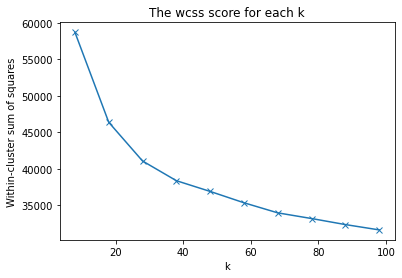

In [5]:
x_ticks = list(range(8,100,10))
plt.plot(x_ticks, _scores, 'x-')
plt.xlabel('k')
plt.ylabel('Within-cluster sum of squares')
plt.title('The wcss score for each k')
plt.show()

Przybliżamy do dokładniejszego zbadania region 25-50, ponieważ jest w nim największe załamanie.

In [6]:
kmeansmap = {n: KMeans(n_clusters=n,random_state=0) for n in range(25,50,1)}
for val in  kmeansmap.values():
    val.fit(data)


_scores = [-val.score(data) for val in kmeansmap.values()]

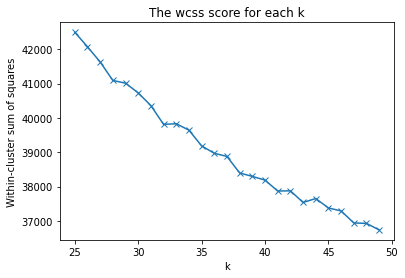

In [90]:
x_ticks = list(range(25,50,1))
plt.plot(x_ticks, _scores, 'x-')
plt.xlabel('k')
plt.ylabel('Within-cluster sum of squares')
plt.title('The wcss score for each k')
plt.show()

#### Silhouette score

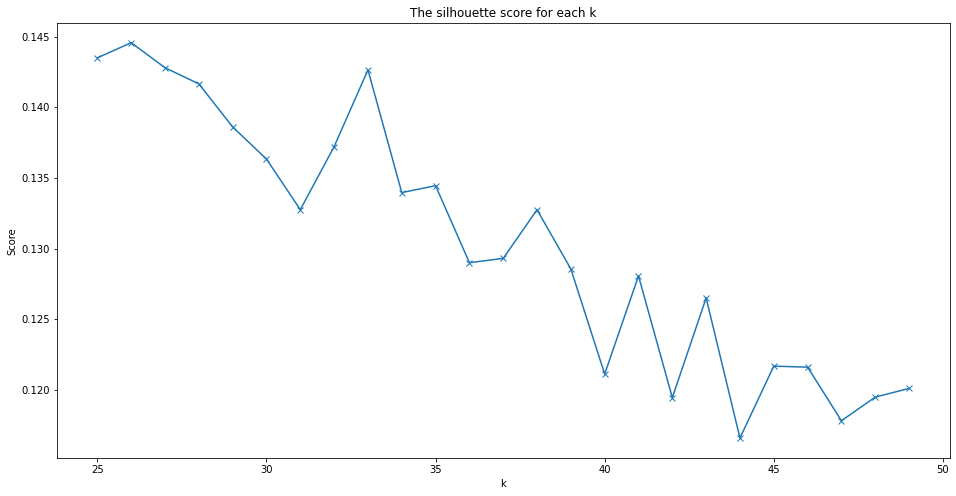

In [92]:
x = kmeansmap.keys()
y = [silhouette_score(data,k.predict(data)) for (n,k) in kmeansmap.items()]
plt.figure(figsize=(16,8))
plt.xlabel('k')
plt.ylabel('score')
plt.title('The silhouette score for each k')
plt.plot(x,y,'x-')

#### Davies-Bouldin score

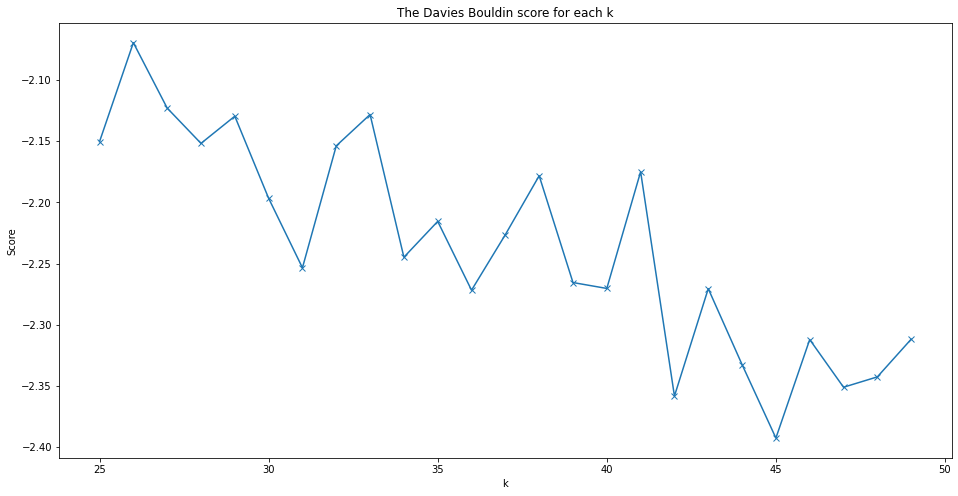

In [93]:
y = [-davies_bouldin_score(data,k.predict(data)) for (n,k) in kmeansmap.items()]
plt.figure(figsize=(16,8))
plt.xlabel('k')
plt.ylabel('score')
plt.title('The Davies_Bouldin score for each k')
plt.plot(x,y,'x-')

Na podstawie tych danych, stwierdziliśmy, że k=45 jest najlepszą liczbą zgrupowań dla tych danych.

## Aglomerative clustering 

In [18]:
agglomemap = {n: AgglomerativeClustering(n_clusters=n) for n in range(25,50,1)}
for val in  agglomemap.values():
    val.fit(data)

#### Silhouette score

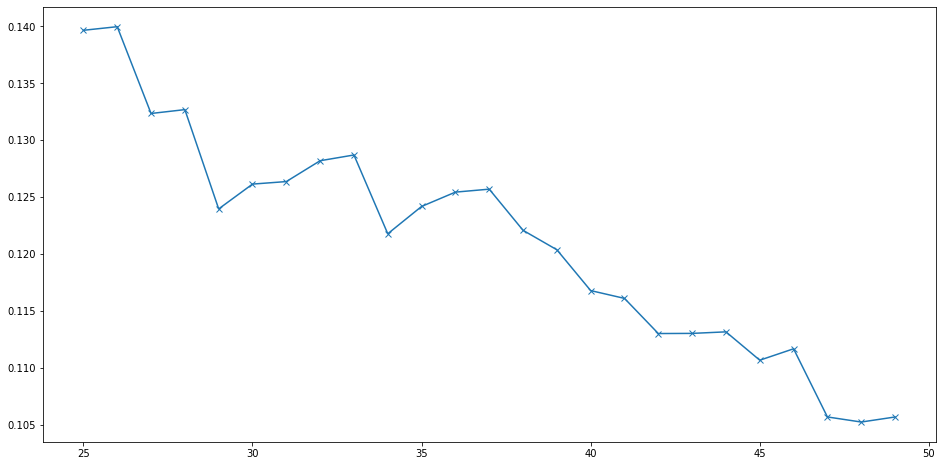

In [19]:
x = kmeansmap.keys()
y = [silhouette_score(data,k.labels_) for (n,k) in agglomemap.items()]
plt.figure(figsize=(16,8))
plt.plot(x,y,'x-')

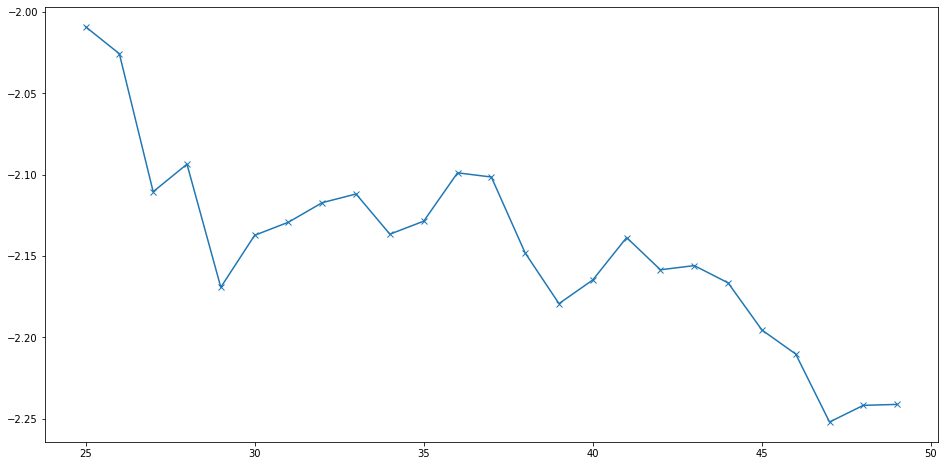

In [20]:
y = [-davies_bouldin_score(data,k.labels_) for (n,k) in agglomemap.items()]
plt.figure(figsize=(16,8))
plt.plot(x,y,'x-')

In [28]:
agglomemap2 = {n: AgglomerativeClustering(n_clusters=n) for n in range(46,56,1)}
for val in  agglomemap2.values():
    val.fit(data)

Sprawdzamy, czy n=47 nie jest tylko lokalnym minimum, poprzedzającym znacząco lepsze minimum, obliczając score dla n w zakresie 46-56

#### Silhouette score

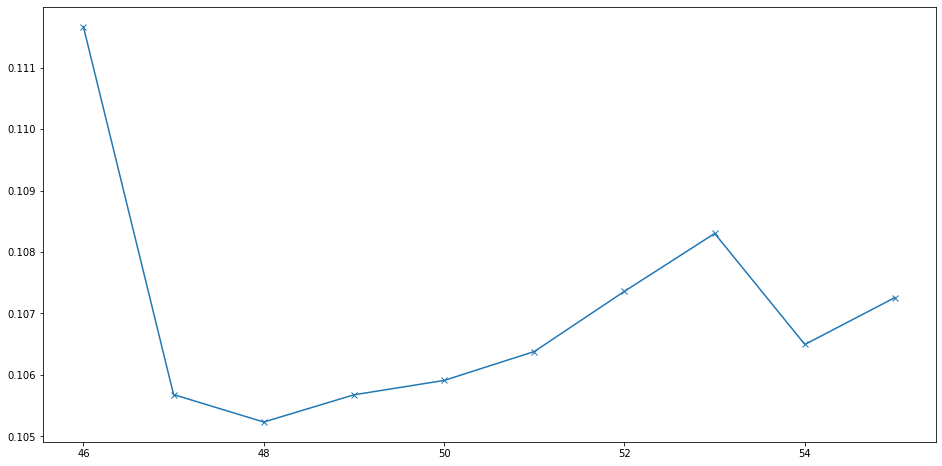

In [31]:
x = agglomemap2.keys()
y = [silhouette_score(data,k.labels_) for (n,k) in agglomemap2.items()]
plt.figure(figsize=(16,8))
plt.plot(x,y,'x-')

#### Davies-Bouldin score

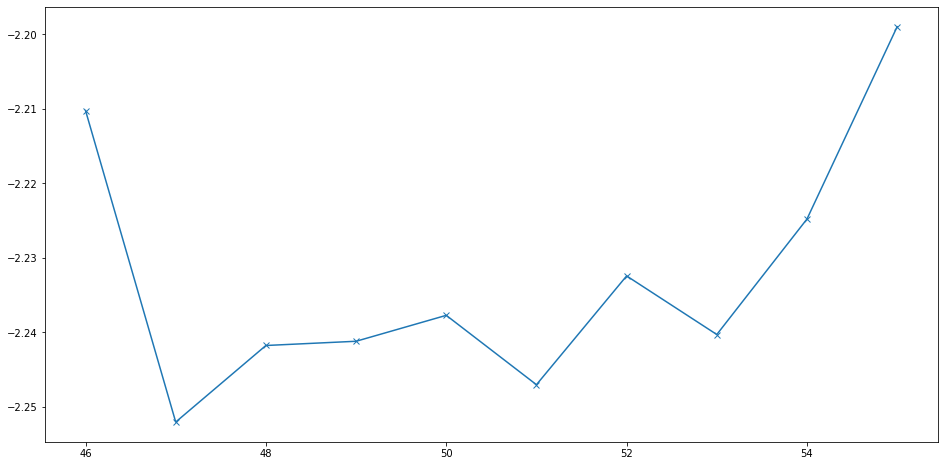

In [32]:
y = [-davies_bouldin_score(data,k.labels_) for (n,k) in agglomemap2.items()]
plt.figure(figsize=(16,8))
plt.plot(x,y,'x-')

W obu przypadkach 47 to n dla którego zostaje osiągnięty najlepszy wynik

## OPTICS performance

In [33]:
o = OPTICS().fit(data)
print(silhouette_score(data,o.labels_))
print(-davies_bouldin_score(data,o.labels_))

/home/mtizim/.local/lib/python3.6/site-packages/sklearn/cluster/_optics.py:803: RuntimeWarning: divide by zero encountered in true_divide
  ratio = reachability_plot[:-1] / reachability_plot[1:]
-0.48469136652664857
-1.1860217484077489


OPTICS osiąga słabe wyniki na poprzednich testach, ale nawet w przypadku osiągnięcia lepszych wyników należałoby go odrzucić, co widać na poniższych wykresach porównujących otrzymane zgrupowania:

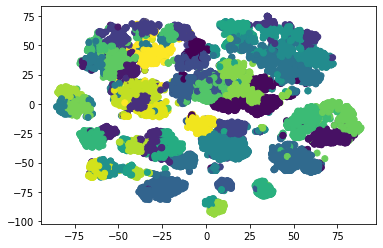

In [36]:
plt.scatter(tsnedata[:,0], tsnedata[:,1], c=kmeansmap[45].predict(data))

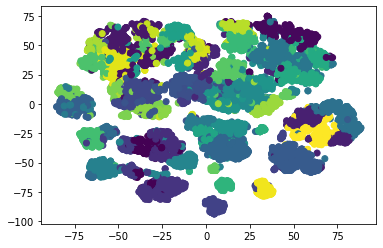

In [59]:
plt.scatter(tsnedata[:,0], tsnedata[:,1], c=agglomemap[47].labels_)

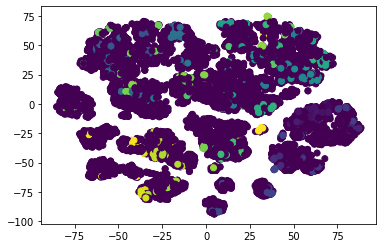

In [38]:
plt.scatter(tsnedata[:,0], tsnedata[:,1], c=o.labels_)

 Bardzo dużo punktów nie zostało zgrupowanych przez OPTICS, przez co nie jest on dobrym algorytmem w tym przypadku

In [96]:
print(f"Niezgrupowane rekordy: {sum( 1 for i in o.labels_ if i == -1)}/{len(o.labels_)} ({sum( 100 for i in o.labels_ if i == -1)/len(o.labels_):.4f}%)")

Niezgrupowane rekordy: 10189/12330 (82.6358%)


# PCA

Poprzednie wizualizacje pokazywały interesujące rezultaty na wykresie PCA, więc postanowiliśmy to porównać z naszymi modelami.

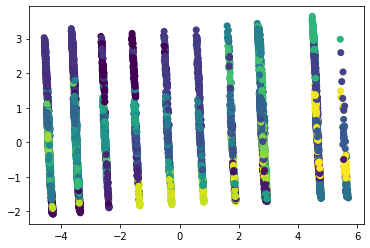

In [53]:
pca = PCA(n_components=2).fit_transform(data)
plt.scatter(pca[:,0], pca[:,1],c=agglomemap[47].labels_)
plt.show()

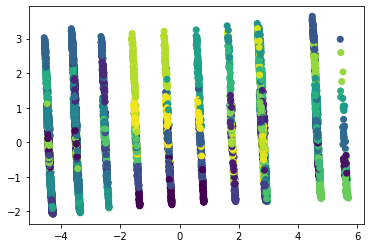

In [54]:
pca = PCA(n_components=2).fit_transform(data)
plt.scatter(pca[:,0], pca[:,1],c=kmeansmap[45].predict(data))
plt.show()

Widać, że widoczne 10 'klas' otrzymanych z PCA nie oddaje pełnego obrazu sytuacji.

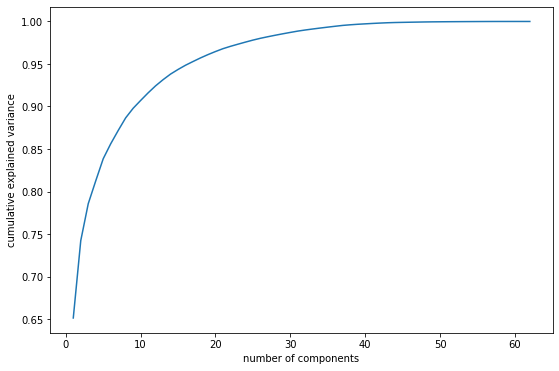

In [56]:
pca = PCA().fit(data)
plt.figure(figsize=(9,6))
plt.plot(range(1, len(pca.explained_variance_ratio_)+1), np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

 Żeby PCA sensownie obrazowało dane, musiałoby mieć przynajmniej 40 wymiarów, co nie jest wizualizowalne.